In [1]:
# install kaggle package
!pip install kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
# copy kaggle account file 
!mkdir ~/.kaggle/
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [3]:
!kaggle datasets download -d vipoooool/new-plant-diseases-dataset

100% 2.69G/2.70G [00:20<00:00, 141MB/s]
100% 2.70G/2.70G [00:20<00:00, 138MB/s]


In [4]:
# unzip dataset
!mkdir Dataset
!unzip /content/new-plant-diseases-dataset.zip -d /content/Dataset/

Streaming output truncated to the last 5000 lines.
  inflating: /content/Dataset/new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/valid/Strawberry___healthy/273a7a9e-18be-4b6a-976a-fa5ffd69b731___RS_HL 4366_90deg.JPG  
  inflating: /content/Dataset/new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/valid/Strawberry___healthy/275f8963-f4f4-4903-962b-1da716725d08___RS_HL 4780_90deg.JPG  
  inflating: /content/Dataset/new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/valid/Strawberry___healthy/275f8963-f4f4-4903-962b-1da716725d08___RS_HL 4780_new30degFlipLR.JPG  
  inflating: /content/Dataset/new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/valid/Strawberry___healthy/27c2aaa4-de4b-4fb1-ba8d-14d4b24b2afa___RS_HL 4665.JPG  
  inflating: /content/Dataset/new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/valid/Strawberry___healthy/27c2aaa4-de4b-4fb1-ba8d-14d4b24b2

In [6]:
!rm -r '/content/Dataset/new plant diseases dataset(augmented)'

In [1]:
import os
import shutil
from glob import glob
import cv2
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import LabelEncoder

In [2]:
train_images, train_labels = list(), list()
valid_images, valid_labels = list(), list()

for type_dir in glob('Dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/*'):
    for image_path in glob(f'{type_dir}/*'):
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (int(98), int(98)))
        train_images.append(image)
        train_labels.append(image_path.split('\\')[-2])

In [3]:
for type_dir in glob('Dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid/*'):
    for image_path in glob(f'{type_dir}/*'):
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (int(98), int(98)))
        valid_images.append(image)
        valid_labels.append(image_path.split('\\')[-2])

In [4]:
train_images = np.array(train_images)
valid_images = np.array(valid_images)

In [3]:
train_labels = np.array(train_labels)
valid_labels = np.array(valid_labels)

In [6]:
train_labels

array(['Apple___Apple_scab', 'Apple___Apple_scab', 'Apple___Apple_scab',
       ..., 'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
       'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
       'Tomato___Tomato_Yellow_Leaf_Curl_Virus'], dtype='<U50')

In [7]:
train_images.shape

(70295, 98, 98, 3)

In [8]:
valid_images.shape

(17572, 98, 98, 3)

In [9]:
np.unique(train_labels)

array(['Apple___Apple_scab', 'Apple___Black_rot',
       'Apple___Cedar_apple_rust', 'Apple___healthy',
       'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew',
       'Cherry_(including_sour)___healthy',
       'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
       'Corn_(maize)___Common_rust_',
       'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy',
       'Grape___Black_rot', 'Grape___Esca_(Black_Measles)',
       'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy',
       'Orange___Haunglongbing_(Citrus_greening)',
       'Peach___Bacterial_spot', 'Peach___healthy',
       'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy',
       'Potato___Early_blight', 'Potato___Late_blight',
       'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy',
       'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch',
       'Strawberry___healthy', 'Tomato___Bacterial_spot',
       'Tomato___Early_blight', 'Tomato___Late_blight',
   

In [10]:
IMAGE_SIZE = [98,98]
n_classes = len(np.unique(train_labels))

In [80]:
def plotclasses(images,labels, height=10, n=n_classes):
    fig, ax = plt.subplots(n,1)
    fig.set_figheight(10*height)
    fig.set_figwidth(12*n)
    for i in range(n):
        x = images[labels==np.unique(labels)[i]][:height]
        ax[i].imshow(np.transpose(x.reshape(1,height,x.shape[1],x.shape[2],x.shape[3]),
                                  (0,2,1,3,4)).reshape(1*x.shape[1],height*x.shape[2],x.shape[3]), interpolation='nearest')
        ax[i].set_ylabel(f'Class : {str(i).zfill(2)}')

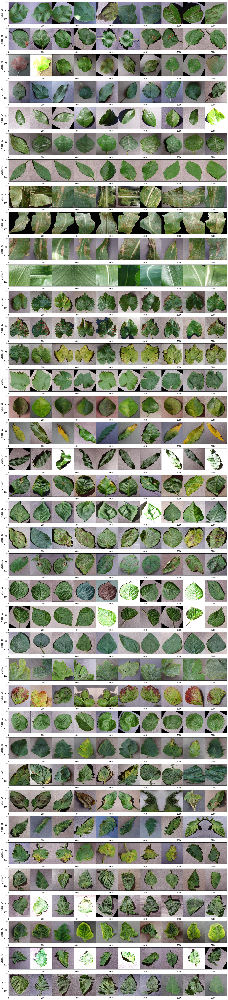

In [81]:
plotclasses(valid_images, valid_labels)

In [11]:
label_names, label_count = np.unique(train_labels, return_counts=True)

In [12]:
import seaborn as sns
import pandas as pd

In [13]:
sns.set(rc={'figure.figsize':(11,5)})

In [85]:
counts = pd.DataFrame()
counts['name'] = label_names
counts['count'] = label_count

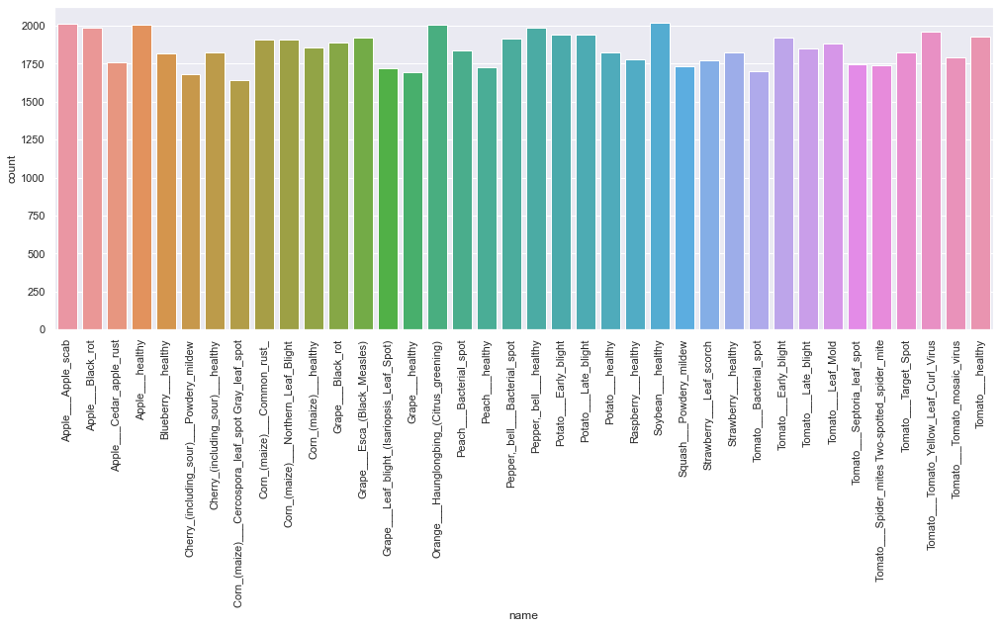

In [86]:
plt.figure(figsize=(17,6))
sns.barplot(data=counts,x='name',y='count')
plt.xticks(rotation=90)
plt.show()

##### None of the class has abnormally low samples, that is why augmentation is not required

In [6]:
import joblib
joblib.dump(label_le,'labels.pkl')

['labels.pkl']